In [1]:
import matplotlib.pyplot as plt

import plotly as py
import plotly.graph_objects as go
import ipywidgets as widgets
import numpy as np
from scipy import special

py.offline.init_notebook_mode(connected=True)

# Gradiente Descendiente

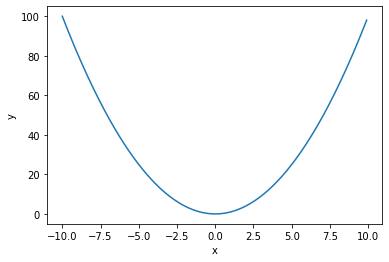

In [2]:
x = np.arange(-10,10,.1)

L = lambda x: x**2
y = L(x)

def ejemplo1(x,y):
    plt.plot(x,y)
    plt.xlabel("x")
    plt.ylabel("y");
    
ejemplo1(x,y)

$$ L(x_i) = x_i^2$$

$$ \frac{\partial L }{\partial x } = 2x$$

$$ w_{k+1} = w_{k} - \epsilon_x \frac{\partial L }{\partial x }  $$

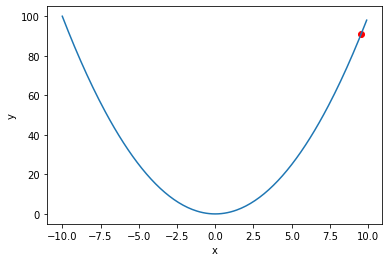

In [3]:
np.random.seed(9090)
w = np.random.uniform(-10,10)
ejemplo1(x,y)
plt.scatter(w,L(w),c='r');

In [4]:
#epsilon=.99
#epsilon=.7
epsilon=.1
dL = lambda x: 2*x
W = [w]

for i in range(10):
    w = w - epsilon*(dL(w))
    W.append(w)
    print("w=",w)
W = np.array(W)

w= 7.639243662809423
w= 6.111394930247538
w= 4.88911594419803
w= 3.9112927553584242
w= 3.1290342042867394
w= 2.5032273634293913
w= 2.002581890743513
w= 1.6020655125948102
w= 1.2816524100758482
w= 1.0253219280606785


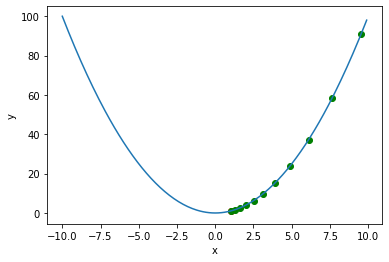

In [5]:
ejemplo1(x,y)
plt.scatter(w,L(w),c='r')
plt.scatter(W,L(W),c='g')

w= 9.358073486941544
w= 9.170912017202713
w= 8.98749377685866
w= 8.807743901321487
w= 8.631589023295057
w= 8.458957242829156
w= 8.289778097972572
w= 8.123982536013122
w= 7.961502885292859
w= 7.802272827587002


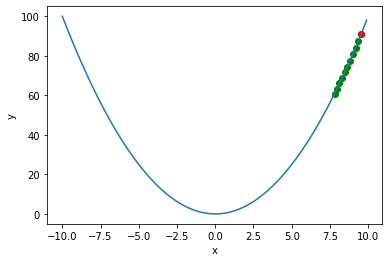

In [6]:
#epsilon=.99
#epsilon=.7
epsilon=.1
epsilon=.01

np.random.seed(9090)
w = np.random.uniform(-10,10)
dL = lambda x: 2*x
W = [w]

for i in range(10):
    w = w - epsilon*(dL(w))
    W.append(w)
    print("w=",w)
W = np.array(W)

ejemplo1(x,y)
plt.scatter(W,L(W),c='g')
plt.scatter(W[0],L(W[0]),c='r')

In [9]:

def GradDes(w=10 ,N=20,epsilon=.1):
    # Generate curve data
    
    x = np.linspace(-10, 10, 100)
    f = lambda t: t**2  
    df = lambda t: 2*t
    y = f(x)

    xm = np.min(x) - 1
    xM = np.max(x) + 1
    ym = np.min( y ) - 1
    yM = np.max( y ) + 1

    W = [w]
    for i in range(N):
        w = w - epsilon*(df(w))
        W.append(w)
        #print("w=",w)
    W = np.array(W)

    # Create figure
    fig = go.Figure(
        data=[go.Scatter(x=x, y=y,
                         mode="lines",
                         line=dict(width=2, color="blue")),
              go.Scatter(x=x, y=y,
                         mode="lines",
                         line=dict(width=2, color="blue"))],
        layout=go.Layout(
            xaxis=dict(range=[xm, xM], autorange=False, zeroline=False),
            yaxis=dict(range=[ym, yM], autorange=False, zeroline=False),
            title_text="Kinematic Generation of a Planar Curve", hovermode="closest",
            updatemenus=[dict(type="buttons",
                              buttons=[dict(label="Play",
                                            method="animate",
                                            args=[None])])]),
        frames=[go.Frame(
            data=[go.Scatter(
                x=[W[k]],
                y=[ f(W[k]) ],
                mode="markers",
                marker=dict(color="red", size=10))])

            for k in range(N)]
    )

    fig.show()


np.random.seed(9090)
w = np.random.uniform(-10,10)
GradDes(w)

In [10]:
GradDes(w,epsilon=1)

In [11]:
GradDes(w=1.5,epsilon=1.1)

In [12]:
GradDes(w=1.5,epsilon=.01)

# Regresión lineal

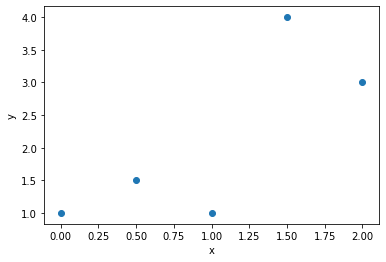

In [13]:
x = np.array( [0,1,2,1.5,0.5])
y = np.array( [1,1,3,4,1.5] )

plt.scatter(x,y)
plt.xlabel("x")
plt.ylabel("y");

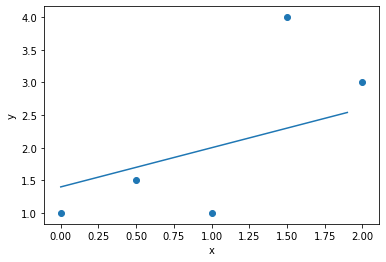

In [14]:
X = np.arange(0,2,.1)

w =.6
b = 1.4
g = lambda X : w*X + b
Y = g(X) # Mi modelo

plt.scatter(x,y)
plt.plot(X,Y)
plt.xlabel("x")
plt.ylabel("y");

In [15]:
from ipywidgets import interact,interact_manual

In [16]:
def G (w,b):
    X = np.arange(-1,3,.1)
    f = lambda X : w*X + b
    Y = f(X) # Mi modelo

    plt.scatter(x,y)
    plt.plot(X,Y)
    plt.xlabel("x")
    plt.ylabel("y");
    plt.show()


interact_manual(G, w=(0,5,.1),b=(0,5,.1));

interactive(children=(FloatSlider(value=2.0, description='w', max=5.0), FloatSlider(value=2.0, description='b'…

In [17]:
w,b

(0.6, 1.4)

$$ g(x_i) = wx_i + b $$

$$ E = \frac{1}{2}\sum_{i=0}^n  (g(x_i) - y_i)^2$$


$$  \frac{\partial E}{\partial w} = \sum_{i=0}^n (g(x_i) - y_i)(x_i) $$

$$  \frac{\partial E}{\partial b} = \sum_{i=0}^n (g(x_i) - y_i) $$  

$$ w_{k+1} = w_{k} - \epsilon_x \frac{\partial E }{\partial w }  $$

$$ b_{k+1} = b_{k} - \epsilon_b \frac{\partial E }{\partial w }  $$

In [18]:
x = np.array( [0,1,2,1.5,0.5])
y = np.array( [1,1,3,4,1.5] )

np.random.seed(9090)
w = np.random.uniform(-10,10)

b = np.random.uniform(-10,10)
e = .01

g = lambda X : w*X + b
#E = .5*(g(x) - y)**2


for i in range(500):
    wt = w - e*np.sum( (g(x) - y)*x )
    b = b - e*np.sum( (g(x) - y) )
    w =wt
    print("w=",w,"b=",b)

w= 8.530568719555443 b= 7.983875816865497
w= 7.62908227474551 b= 7.26315359004445
w= 6.831243424637375 b= 6.623541796804952
w= 6.125223077949324 b= 6.055802535732836
w= 5.500541220316483 b= 5.551751255048727
w= 4.947913066040311 b= 5.104136631280467
w= 4.4591127545232645 b= 4.706534146414428
w= 4.026852590613299 b= 4.353251801367543
w= 3.644676056248924 b= 4.039246581768501
w= 3.3068630229418297 b= 3.76005044986763
w= 3.008345773727811 b= 3.511704776227157
w= 2.744634601886867 b= 3.2907022487294086
w= 2.5117518943088815 b= 3.093935406198595
w= 2.3061737319257856 b= 2.918651041173221
w= 2.1247781499726908 b= 2.7624098025182704
w= 1.9647992985988254 b= 2.623050404893722
w= 1.8237868309592273 b= 2.498657919719095
w= 1.6995699226513306 b= 2.3875356821851788
w= 1.5902253943432219 b= 2.2881804019433534
w= 1.4940494696703126 b= 2.1992601121290245
w= 1.409532753838588 b= 2.119594633039058
w= 1.335338065648741 b= 2.0481382636951757
w= 1.2702807975403267 b= 1.9839644472279798
w= 1.21331151536340

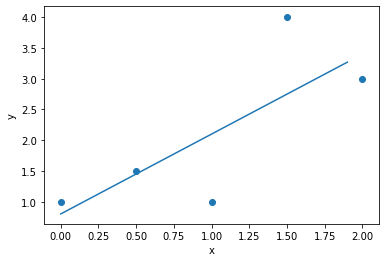

In [19]:
X = np.arange(0,2,.1)

g = lambda X : w*X + b
Y = g(X) # Mi modelo

plt.scatter(x,y)
plt.plot(X,Y)
plt.xlabel("x")
plt.ylabel("y");

In [20]:
from sklearn.linear_model import LinearRegression

In [21]:
#Reshape your data either using 
#array.reshape(-1, 1) if your data has a single feature or 
#array.reshape(1, -1) if it contains a single sample.

regressor = LinearRegression()  
regressor.fit(np.array(x).reshape(-1, 1), np.array(y).reshape(-1, 1) )


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [22]:
regressor.coef_,regressor.intercept_

(array([[1.3]]), array([0.8]))

In [26]:
%matplotlib notebook

In [30]:
from celluloid import Camera

<IPython.core.display.Javascript object>


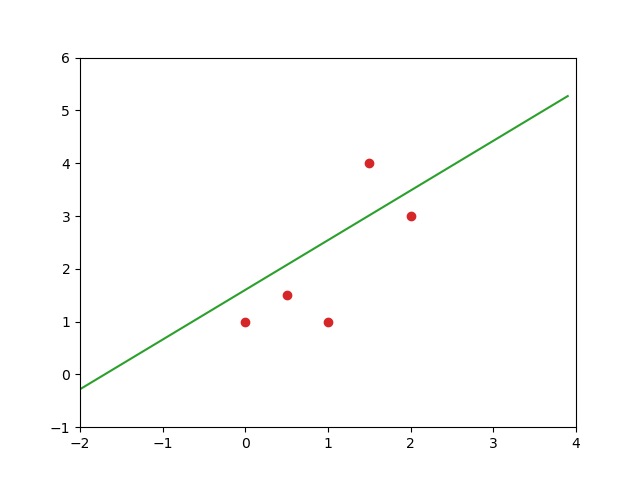

In [31]:
fig = plt.figure()
camera = Camera(fig)

np.random.seed(9090)
w = np.random.uniform(-10,10)
b = np.random.uniform(-10,10)
e = .01

delta = 2
X = np.arange(-delta,2+delta,.1)
g = lambda X : w*X + b
Y = g(X) # Mi modelo

plt.scatter(x,y)

plt.xlim(x.min() - delta, x.max() + delta) 
plt.ylim(y.min() - delta, y.max() + delta) 

for i in range(50):
    wt = w - e*np.sum( (g(x) - y)*x )
    b = b - e*np.sum( (g(x) - y) )
    w =wt
    
    plt.scatter(x, y)
    plt.plot(X,g(X))
    camera.snap()


anim = camera.animate(blit=True)
#anim.save('dots.gif', writer='imagemagick')
plt.show()

## Tarea generar una animacion en 3d de una funcion y encontrar su minimo por medio del descenso del gradiente. 

In [32]:
import plotly.graph_objects as go

n = 2
x = np.arange(-n,n,.1)
y = np.arange(-n,n,.1)

XX,YY = np.meshgrid(x,y)
##ZZ =  np.sin( XX**2 + YY**2)
#ZZ =  XX * np.exp( -XX**2 - YY**2)
ZZ = 7*XX*YY /( np.exp(XX**2 + YY**2 ) )

fig = go.Figure(go.Surface(
    contours = {
        "x": {"show": True, "start": 1.5, "end": 2, "size": 0.04, "color":"white"},
        "z": {"show": True, "start": 0.5, "end": 0.8, "size": 0.05}
    },
    x = XX,
    y = YY,
    z = ZZ))

fig.update_layout(
        scene = {
            "xaxis": {"nticks": 20},
            "zaxis": {"nticks": 4},
            'camera_eye': {"x": 0, "y": -1, "z": 0.5},
            "aspectratio": {"x": 1, "y": 1, "z": 0.2}
            
        })
fig.show()

Why Momentum Really Works

https://distill.pub/2017/momentum/



# Clasificación 

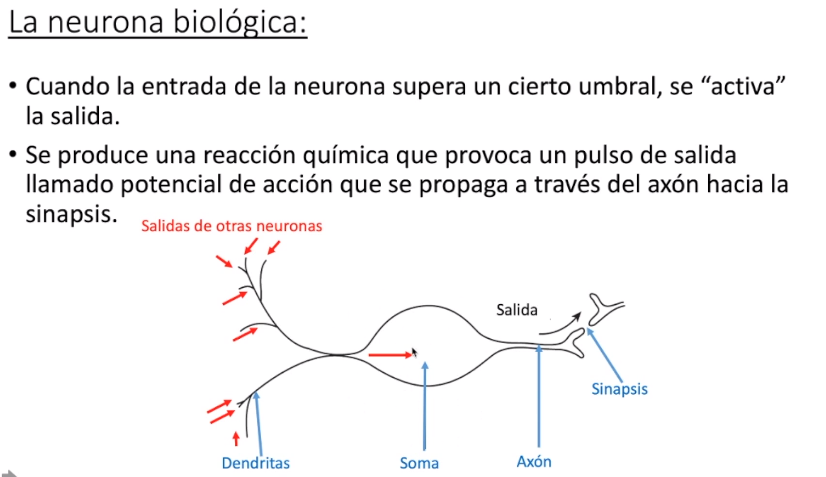

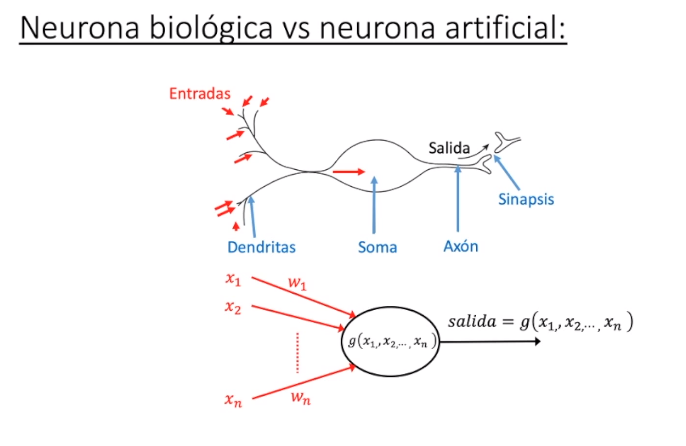

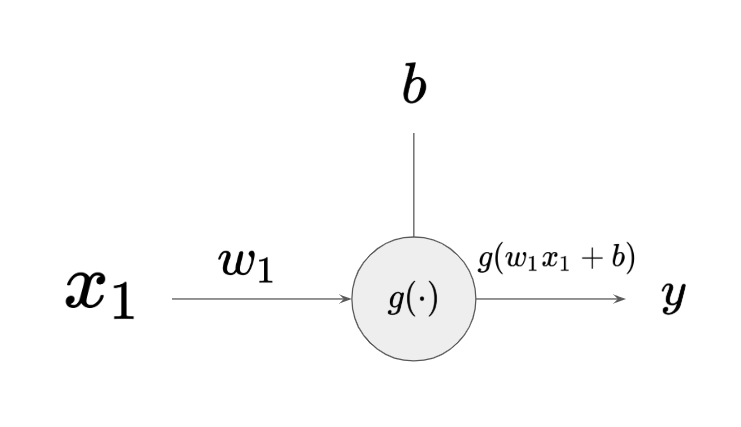

$$sigmoid(x) = \frac{1}{1 + e^{-x}} $$
$$\frac{d sigmoid}{dx}= sigmoid(x) (1- sigmoid(x) ) $$

$$\lambda = wx_i + b$$
$$ g(x_i) = sigmoid (\lambda) $$ 

$$ E = \frac{1}{2}\sum_{i=0}^n  (g(x_i) - y_i)^2$$

$$  \frac{\partial E}{\partial w} = \sum_{i=0}^n (g(x_i) - y_i)g'(x_i)(x_i) $$

$$  \frac{\partial E}{\partial b} = \sum_{i=0}^n (g(x_i) - y_i)g'(x_i) $$ 

$$ w_{k+1} = w_{k} - \epsilon_x \frac{\partial E }{\partial w }  $$

$$ b_{k+1} = b_{k} - \epsilon_b \frac{\partial E }{\partial w }  $$

$${\displaystyle S(x)={\frac {1}{1+e^{-x}}}={\frac {e^{x}}{e^{x}+1}}.}$$

In [33]:
# funciones de activacion redes neuronales
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def dsigmoid(x):
    return sigmoid(x)*(1- sigmoid(x) )

def logistic_sigmoid(x):
    return np.exp(x) / (1 + np.exp(x))


<IPython.core.display.Javascript object>


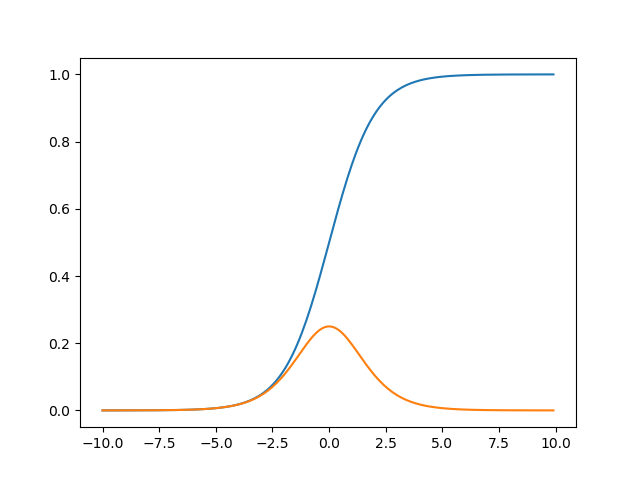

In [34]:
x = np.arange(-10,10,.1)
y = sigmoid(x)
y2 = logistic_sigmoid(x)
plt.plot(x,y)
#plt.plot(x,y2)
y2 = dsigmoid(x)

plt.plot(x,y2)

<IPython.core.display.Javascript object>


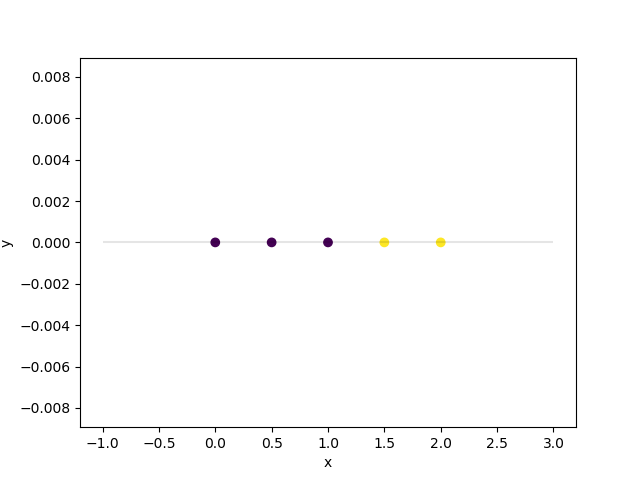

In [35]:
x = np.array( [0,1,2,1.5,0.5])
y = np.zeros(len(x))
clase = [0,0,1,1,0]

plt.scatter(x,y,c=clase)
plt.hlines(0,-1,3,colors=(0,0,0,.1))
plt.xlabel("x")
plt.ylabel("y");


In [54]:
x = np.array( [0,1,2,1.5,0.5])
clase = [0,0,1,1,0]

#np.random.seed(90)
w = np.random.normal(0,1) #np.random.uniform(-10,10)
b = 1
epsilon = .01

g = lambda X : sigmoid(w*X + b)
dg = lambda X : dsigmoid(w*X + b)
#g = lambda X : logistic_sigmoid(w*X + b)
#E = .5*(g(x) - y)**2

for i in range(10000):
    
    wt = w - epsilon*np.sum( (g(x) - clase)*(dg(x)*x) )
    b = b - epsilon*np.sum( (g(x) - clase)*dg(x) )       
    w = wt
    
    #print("error= ", .5*np.sum( (g(x) - clase)))
print("error= ", .5*np.sum( (g(x) - clase)))

error=  0.03873466974729392


In [55]:
w,b

(3.533900489195968, -4.298093574637964)

<IPython.core.display.Javascript object>


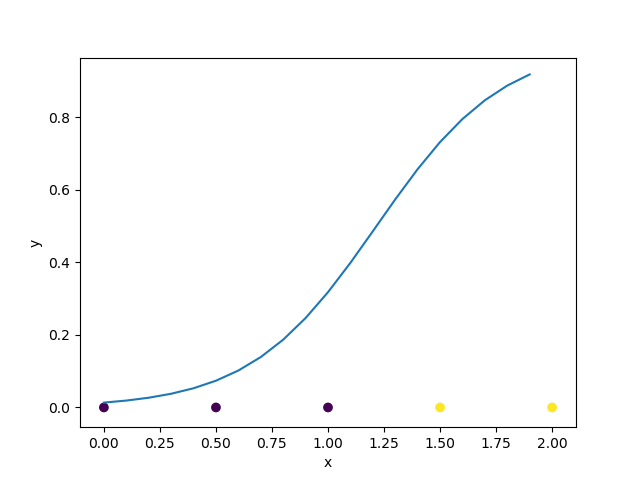

In [56]:
X = np.arange(0,2,.1)
Y = g(X) # Mi modelo

plt.scatter(x,y,c=clase)
plt.plot(X,Y)
plt.xlabel("x")
plt.ylabel("y");

In [57]:
w*x + b

array([-4.29809357, -0.76419309,  2.7697074 ,  1.00275716, -2.53114333])

In [58]:
g(x)

array([0.01341212, 0.3177366 , 0.94101675, 0.73160032, 0.07370355])

In [59]:
clase

[0, 0, 1, 1, 0]

In [60]:
np.round( g(x) )

array([0., 0., 1., 1., 0.])

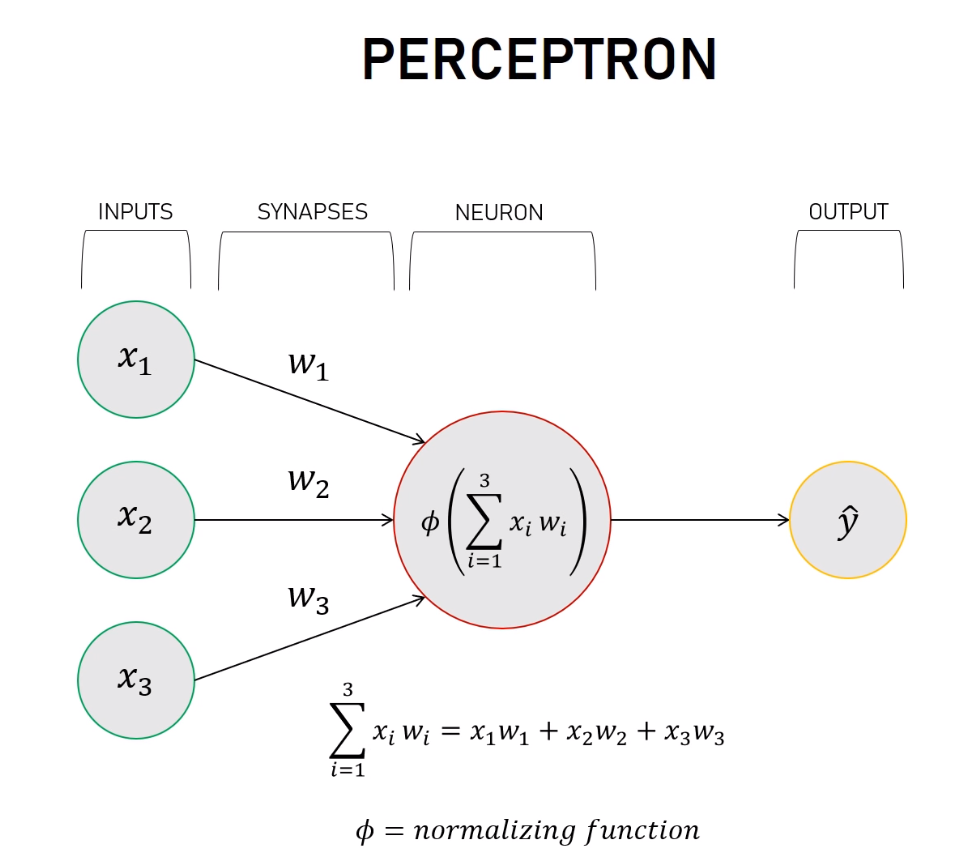

In [291]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))


def sigmoid_derivative(sigmoid):
    return sigmoid*(1 - sigmoid)

x = np.array([ [0,1,2,1.5,0.5],
               [1,1,3,4,1.5], 
               [1,1,1,1,1] ]).T

clase = np.array( [0,0,1,1,0])


print("clase:",clase.shape)
clase = clase[:,np.newaxis]
print("clase:",clase.shape)

clase: (5,)
clase: (5, 1)


<IPython.core.display.Javascript object>


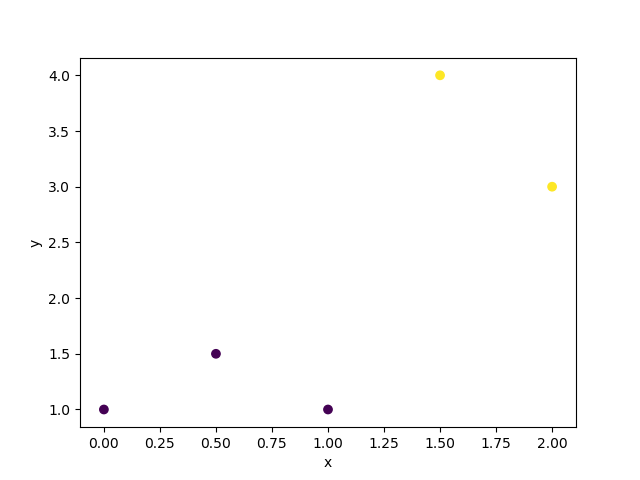

In [262]:
plt.scatter(x[:,0],x[:,1],c=clase)

plt.xlabel("x")
plt.ylabel("y");

In [292]:
#np.random.seed(9090)
np.random.seed(1)
w = np.random.normal(0,1,(3,1))

for i in range(1000):
    
    input_layer = x
    
    outputs = sigmoid (x@w)
    error = clase - outputs
    
    adjustments = error * sigmoid_derivative(outputs)
    w += x.T@ adjustments 
    
print("error= ", .5*np.sum( (sigmoid (x@w) - clase)))

error=  0.015546099326768786


In [293]:
sigmoid (x@w) #

array([[0.00375661],
       [0.03343617],
       [0.96890774],
       [0.99028677],
       [0.03470491]])

In [290]:
clase

array([[0],
       [0],
       [1],
       [1],
       [0]])

In [294]:
np.round( sigmoid (x@w) )

array([[0.],
       [0.],
       [1.],
       [1.],
       [0.]])

A simple explanation of how they work and how to implement one from scratch in Python

https://victorzhou.com/blog/intro-to-neural-networks/

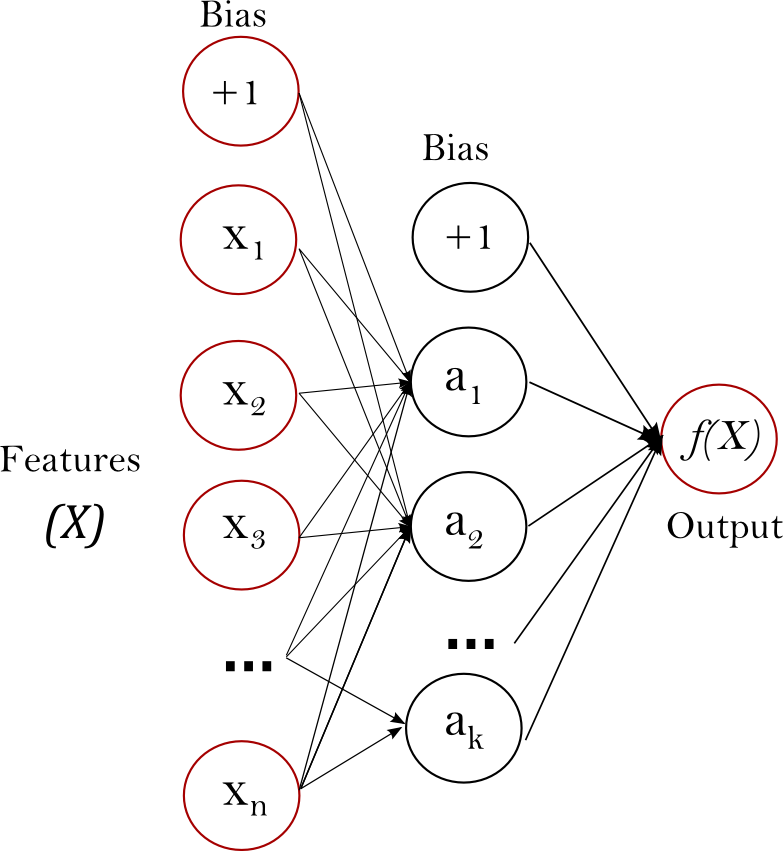

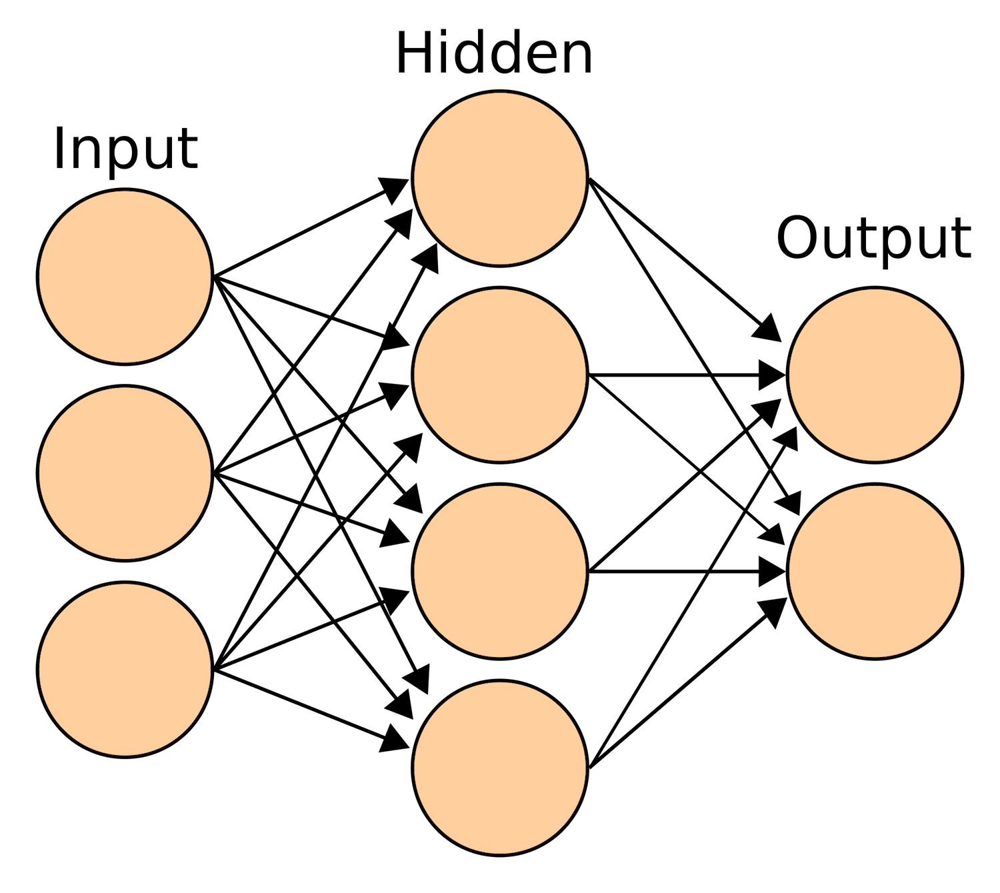

# Backpropagation calculus

https://www.youtube.com/watch?v=tIeHLnjs5U8

# Solución rápida ejemplo anterior

https://scikit-learn.org/stable/modules/neural_networks_supervised.html

In [295]:
from sklearn.neural_network import MLPClassifier

In [322]:
x = np.array([ [0,1,2,1.5,0.5],
               [1,1,3,4,1.5], 
               [1,1,1,1,1] ]).T

y = np.array( [0,0,1,1,0])

In [330]:
clf = MLPClassifier(solver='lbfgs', alpha=1e-5,random_state=1)

In [331]:
clf.fit(x, y)

MLPClassifier(activation='relu', alpha=1e-05, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=1, shuffle=True, solver='lbfgs', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

In [332]:
clf.predict(x)

array([0, 0, 1, 1, 0])

In [318]:
X = [[0., 0.], [1., 1.]]
y = [0, 1]
clf = MLPClassifier(solver='lbfgs', alpha=1e-5,
                    hidden_layer_sizes=(5, 2), random_state=1)

clf.fit(X, y)

MLPClassifier(activation='relu', alpha=1e-05, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(5, 2), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=1, shuffle=True, solver='lbfgs', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

In [297]:
clf.predict([[2., 2.], [-1., -2.]])

array([1, 0])

# Multi-layer Perceptron (MLP) 

In [344]:
#https://colab.research.google.com/drive/1vm1EAZ7lLRooZHqHTfUlul5ZXpGmb_SZ

In [390]:
from sklearn.datasets import make_circles
from sklearn.model_selection import train_test_split

<IPython.core.display.Javascript object>


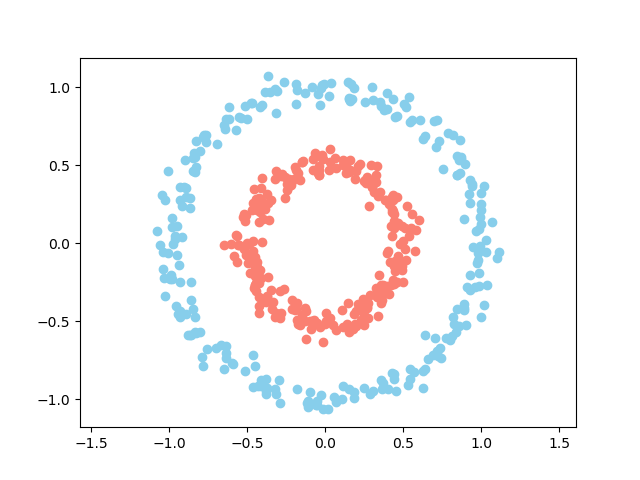

In [484]:
# CREAR EL DATASET

n = 500
p = 2

X, Y = make_circles(n_samples=n, factor=0.5, noise=0.05)

Y = Y[:, np.newaxis]

plt.scatter(X[Y[:, 0] == 0, 0], X[Y[:, 0] == 0, 1], c="skyblue")
plt.scatter(X[Y[:, 0] == 1, 0], X[Y[:, 0] == 1, 1], c="salmon")
plt.axis("equal")
plt.show()

In [485]:
X.shape,Y.shape

((500, 2), (500, 1))

In [486]:
#Y.reshape(-1).shape
Y = Y.reshape(-1) # Solo para quitar el warning A column-vector y was passed when a 1d array was expected.

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

In [487]:
X_train.shape, X_test.shape

((335, 2), (165, 2))

In [488]:
clf = MLPClassifier(solver='lbfgs', alpha=1e-5,
                    hidden_layer_sizes=(4, 8), random_state=1)

clf.fit(X_train, y_train)

MLPClassifier(activation='relu', alpha=1e-05, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(4, 8), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=1, shuffle=True, solver='lbfgs', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

In [489]:
predictions = clf.predict(X_test)
predictions

array([1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0,
       1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0,
       1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1], dtype=int64)

In [490]:
y_test.T

array([1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0,
       0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0,
       0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0,
       1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], dtype=int64)

In [491]:
predictions == y_test.T

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True, False, False, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True, False,  True,
        True,  True, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True, False,  True, False,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True, False,
        True,  True,  True,  True,  True,  True, False, False,  True,
        True,  True,  True,  True,  True,  True,  True, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [492]:
clf.score(X_test,y_test)

0.8666666666666667

In [494]:
np.sum( predictions == y_test.T) / len(predictions)

0.8666666666666667

In [498]:
from sklearn.metrics import classification_report, confusion_matrix

In [499]:
print(confusion_matrix(y_test,predictions))
print(classification_report(y_test,predictions))

[[50 20]
 [ 2 93]]
              precision    recall  f1-score   support

           0       0.96      0.71      0.82        70
           1       0.82      0.98      0.89        95

    accuracy                           0.87       165
   macro avg       0.89      0.85      0.86       165
weighted avg       0.88      0.87      0.86       165



- The precision is the ratio tp / (tp + fp) where tp is the number of true positives and fp the number of false positives. The precision is intuitively the ability of the classifier not to label as positive a sample that is negative.

- The recall is the ratio tp / (tp + fn) where tp is the number of true positives and fn the number of false negatives. The recall is intuitively the ability of the classifier to find all the positive samples.

- The F-beta score can be interpreted as a weighted harmonic mean of the precision and recall, where an F-beta score reaches its best value at 1 and worst score at 0.

- The F-beta score weights recall more than precision by a factor of beta. beta == 1.0 means recall and precision are equally important.

The support is the number of occurrences of each class in y_true.

https://scikit-learn.org/stable/modules/model_evaluation.html#precision-recall-f-measure-metrics

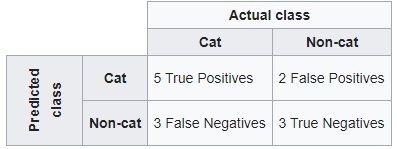

a table of confusion (sometimes also called a confusion matrix) https://en.wikipedia.org/wiki/Confusion_matrix

In [ ]:
clf = MLPClassifier(solver='lbfgs', alpha=1e-5,
                    hidden_layer_sizes=(4, 8), random_state=1)

clf.fit(X_train, y_train)

In [504]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense

In [512]:
n = 500
p = 2

X, Y = make_circles(n_samples=n, factor=0.5, noise=0.05)

Y = Y[:, np.newaxis]


X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

#plt.scatter(X[Y[:, 0] == 0, 0], X[Y[:, 0] == 0, 1], c="skyblue")
#plt.scatter(X[Y[:, 0] == 1, 0], X[Y[:, 0] == 1, 1], c="salmon")
#plt.axis("equal")
#plt.show()

In [534]:
model = Sequential()
model.add( Dense(4, input_dim=2,activation = "relu") )
model.add( Dense(8, activation = "relu") )
model.add(Dense(1, activation='sigmoid'))

model.compile(loss = "binary_crossentropy", optimizer = "adam", metrics = ["accuracy"])
## model.compile(loss = "binary_crossentropy", optimizer = "adam", metrics = ['accuracy', 'mse']) 


- In this case, we will use **cross entropy** as the loss argument. This loss is for a **binary classification** problems and is defined in Keras as **binary_crossentropy**. You can learn more about choosing loss functions based on your problem here:

https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/



- We will define the **optimizer** as **the efficient stochastic gradient descent algorithm “adam“**. This is a popular version of gradient descent because it automatically tunes itself and gives good results in a wide range of problems. To learn more about the Adam version of stochastic gradient descent see the post:

https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/

- Finally, because it is a classification problem, we will collect and report the classification accuracy, defined via the metrics argument.

-- The loss function is used to optimize your model. This is the function that will get minimized by the optimizer.

-- **A metric is used to judge the performance of your model. This is only for you to look at and has nothing to do with the optimization process.**

**Model Loss Functions**

Some common examples include:

- **mse**: for mean squared error. or MSE, loss is the default loss to use for regression problems.
- **binary_crossentropy**: for binary logarithmic loss (logloss).
- **categorical_crossentropy**: for multi-class logarithmic loss (logloss).


**Model Optimizers**

Some popular gradient descent optimizers you might like to choose from include:

- **SGD**: stochastic gradient descent, with support for momentum.
- **RMSprop**: adaptive learning rate optimization method proposed by Geoff Hinton.
- **Adam**: Adaptive Moment Estimation (Adam) that also uses adaptive learning rates.


**Model Metrics**

Metrics are evaluated by the model during training.

https://machinelearningmastery.com/build-multi-layer-perceptron-neural-network-models-keras/

# Fit Keras Model

https://machinelearningmastery.com/tutorial-first-neural-network-python-keras/


We can train or fit our model on our loaded data by calling the fit() function on the model.

Training occurs over epochs and each epoch is split into batches.

- **Epoch**: One pass through all of the rows in the training dataset.
- **Batch**: One or more samples considered by the model within an epoch before weights are updated.

In [536]:
model.fit(X_train,y_train, epochs=50, batch_size=10)

Epoch 1/50
335/335 [==============================] - 0s 451us/step - loss: 0.6787 - accuracy: 0.5015 - mse: 0.2432
Epoch 2/50
335/335 [==============================] - 0s 215us/step - loss: 0.6744 - accuracy: 0.4985 - mse: 0.2412
Epoch 3/50
335/335 [==============================] - 0s 209us/step - loss: 0.6707 - accuracy: 0.5701 - mse: 0.2394
Epoch 4/50
335/335 [==============================] - 0s 209us/step - loss: 0.6658 - accuracy: 0.5881 - mse: 0.2371
Epoch 5/50
335/335 [==============================] - 0s 209us/step - loss: 0.6612 - accuracy: 0.5821 - mse: 0.2349
Epoch 6/50
335/335 [==============================] - 0s 206us/step - loss: 0.6567 - accuracy: 0.5821 - mse: 0.2328
Epoch 7/50
335/335 [==============================] - 0s 209us/step - loss: 0.6515 - accuracy: 0.6000 - mse: 0.2302
Epoch 8/50
335/335 [==============================] - 0s 203us/step - loss: 0.6462 - accuracy: 0.6239 - mse: 0.2277
Epoch 9/50
335/335 [==============================] - 0s 215us/step - lo

If the model's prediction is perfect, the loss is zero; otherwise, the loss is greater. The goal of training a model is to find a set of weights and biases that have low loss, on average, across all examples. **Higher loss is the worse(bad prediction) for any model**.

The loss is calculated on training and validation and its interpretation is how well the model is doing for these two sets. Unlike accuracy, a loss is not a percentage. It is a sum of the errors made for each example in training or validation sets.

- A loss is a number indicating how bad the model's prediction was on a single example.



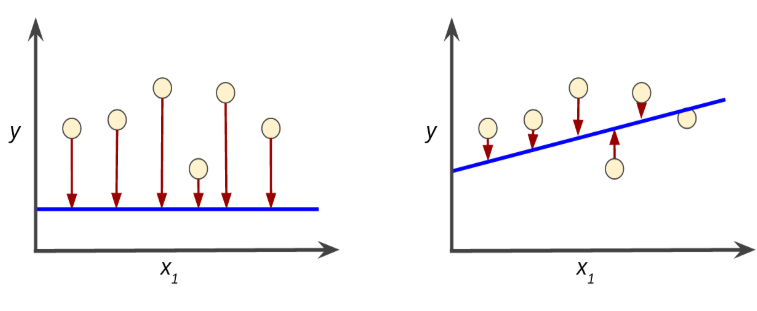

There are two graphs representing the losses of two different models, the left graph has a high loss and the right graph has a low loss.   

In [522]:
model.predict(X_test)

array([[0.7078404 ],
       [0.20872456],
       [0.6917301 ],
       [0.6947756 ],
       [0.66053337],
       [0.7078404 ],
       [0.0339639 ],
       [0.06991637],
       [0.18868603],
       [0.624864  ],
       [0.02309527],
       [0.67281264],
       [0.06131149],
       [0.67735857],
       [0.7078404 ],
       [0.05796908],
       [0.7001222 ],
       [0.6672215 ],
       [0.03276169],
       [0.61391056],
       [0.7078404 ],
       [0.05202816],
       [0.04825933],
       [0.01959316],
       [0.7078404 ],
       [0.06684261],
       [0.11981364],
       [0.07796437],
       [0.34071198],
       [0.04407044],
       [0.7004555 ],
       [0.05936296],
       [0.0501149 ],
       [0.03409754],
       [0.0472144 ],
       [0.03958802],
       [0.7078404 ],
       [0.6730696 ],
       [0.66761464],
       [0.22945696],
       [0.6966121 ],
       [0.7078404 ],
       [0.7078404 ],
       [0.58463913],
       [0.67412555],
       [0.7078404 ],
       [0.05848163],
       [0.707

In [524]:
y_test

array([[1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [0],
       [0],
       [1],
       [0],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [1],
       [1],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
    

In [525]:
model.evaluate(X_test, y_test)

165/165 [==============================] - 0s 42us/step


[0.24325417858181578, 1.0]

In [527]:
loss, accuracy = model.evaluate(X_test, y_test)
print('Loss: %.2f  and Accuracy: %.2f' % (loss, accuracy*100))

165/165 [==============================] - 0s 42us/step
Loss: 0.24  and Accuracy: 100.00


In [537]:
n = 500
p = 2

X, Y = make_circles(n_samples=n, factor=0.5, noise=0.05)

Y = Y[:, np.newaxis]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

#plt.scatter(X[Y[:, 0] == 0, 0], X[Y[:, 0] == 0, 1], c="skyblue")
#plt.scatter(X[Y[:, 0] == 1, 0], X[Y[:, 0] == 1, 1], c="salmon")
#plt.axis("equal")
#plt.show()

In [547]:
model = Sequential()
model.add( Dense(4, input_dim=2,activation = "relu") )
model.add( Dense(8, activation = "relu") )
model.add(Dense(1, activation='sigmoid'))

model.compile(loss = "binary_crossentropy", optimizer = "adam", metrics = ["accuracy"])
#history = model.fit(X_train,y_train, epochs=50, batch_size=10)
history = model.fit(X_train,y_train,validation_data=(X_test, y_test), epochs=50, batch_size=10)

Train on 335 samples, validate on 165 samples
Epoch 1/50
335/335 [==============================] - 0s 499us/step - loss: 0.6958 - accuracy: 0.4925 - val_loss: 0.6881 - val_accuracy: 0.4667
Epoch 2/50
335/335 [==============================] - 0s 245us/step - loss: 0.6880 - accuracy: 0.4985 - val_loss: 0.6808 - val_accuracy: 0.4545
Epoch 3/50
335/335 [==============================] - 0s 263us/step - loss: 0.6803 - accuracy: 0.5134 - val_loss: 0.6749 - val_accuracy: 0.5333
Epoch 4/50
335/335 [==============================] - 0s 242us/step - loss: 0.6736 - accuracy: 0.5194 - val_loss: 0.6681 - val_accuracy: 0.5818
Epoch 5/50
335/335 [==============================] - 0s 239us/step - loss: 0.6665 - accuracy: 0.5522 - val_loss: 0.6609 - val_accuracy: 0.6606
Epoch 6/50
335/335 [==============================] - 0s 239us/step - loss: 0.6599 - accuracy: 0.5821 - val_loss: 0.6520 - val_accuracy: 0.6970
Epoch 7/50
335/335 [==============================] - 0s 242us/step - loss: 0.6496 - accur

In [548]:
print("Train:")
loss,accuracy = model.evaluate(X_train,y_train,verbose=0)
print('Loss: %.2f  and Accuracy: %.2f' % (loss, accuracy*100))

print("Test:")
loss, accuracy = model.evaluate(X_test, y_test,verbose=0)
print('Loss: %.2f  and Accuracy: %.2f' % (loss, accuracy*100))

Train:
Loss: 0.16  and Accuracy: 94.93
Test:
Loss: 0.17  and Accuracy: 95.76


<IPython.core.display.Javascript object>


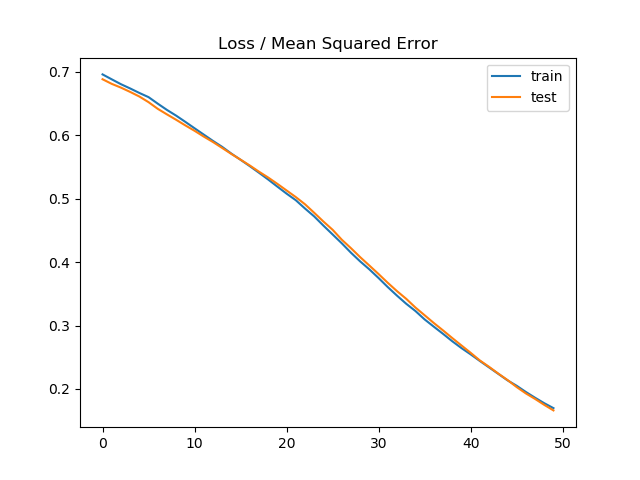

In [549]:
# plot loss during training
plt.title('Loss / Mean Squared Error')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

https://nextjournal.com/gkoehler/digit-recognition-with-keras

https://www.tensorflow.org/tutorials/quickstart/beginner

In [550]:
mnist = tf.keras.datasets.mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()

x_train, x_test = x_train / 255.0, x_test / 255.0

In [559]:
x_train[0].shape

(28, 28)

<IPython.core.display.Javascript object>


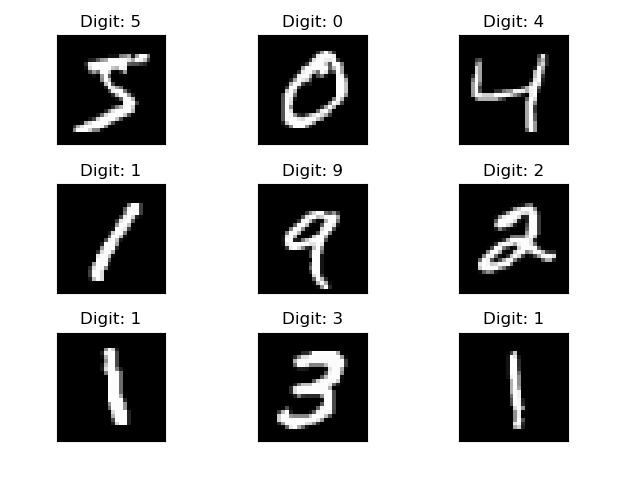

In [557]:
fig = plt.figure()
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.tight_layout()
    plt.imshow(x_train[i], cmap='gray', interpolation='none')
    plt.title("Digit: {}".format(y_train[i]))
    plt.xticks([])
    plt.yticks([])
#fig

In order to train our neural network to classify images we first have to unroll the height width pixel format into one big vector - the input vector.

So its length must be 28*28 =784 


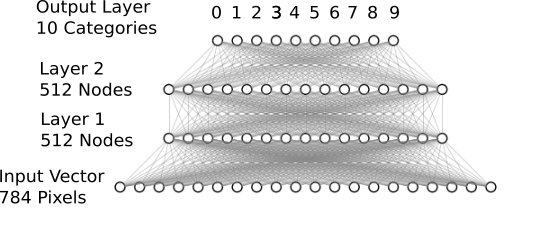

In [551]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [552]:
model.fit(x_train, y_train, epochs=5)

model.evaluate(x_test,  y_test, verbose=2)

Train on 60000 samples
Epoch 1/5
60000/60000 [==============================] - 3s 52us/sample - loss: 0.2956 - accuracy: 0.9151
Epoch 2/5
60000/60000 [==============================] - 3s 50us/sample - loss: 0.1407 - accuracy: 0.9584
Epoch 3/5
60000/60000 [==============================] - 3s 48us/sample - loss: 0.1061 - accuracy: 0.9676
Epoch 4/5
60000/60000 [==============================] - 3s 48us/sample - loss: 0.0873 - accuracy: 0.9728
Epoch 5/5
60000/60000 [==============================] - 3s 48us/sample - loss: 0.0734 - accuracy: 0.9769
10000/10000 - 0s - loss: 0.0736 - accuracy: 0.9766


[0.07364981549717486, 0.9766]

In [566]:
from keras.layers.core import Dense, Dropout, Activation, Flatten

In [586]:
model = Sequential()
model.add(Flatten(input_shape=(28, 28)) )
model.add(Dense(128,activation = "relu") )
model.add(Dropout(0.2))
model.add(Dense(10,activation = "softmax" ) )

model.compile(loss='sparse_categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

In [603]:
# building a linear stack of layers with the sequential model
model = Sequential()
model.add(Flatten(input_shape=(28, 28)) )
model.add(Dense(512))
model.add(Activation('relu'))                            
model.add(Dropout(0.2))

model.add(Dense(512,activation = "relu") )
model.add(Dropout(0.2))
model.add(Dense(10,activation = "softmax" ) )

# compiling the sequential model
model.compile(loss='sparse_categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

In [594]:
#model.fit(x_train, y_train,batch_size=128, epochs=20)

In [604]:
# training the model and saving metrics in history
history = model.fit(x_train, y_train,
          batch_size=128, epochs=20,
          verbose=2,
          validation_data=(x_test,  y_test))

Train on 60000 samples, validate on 10000 samples
Epoch 1/20
 - 6s - loss: 0.2476 - accuracy: 0.9239 - val_loss: 0.1149 - val_accuracy: 0.9633
Epoch 2/20
 - 6s - loss: 0.1016 - accuracy: 0.9692 - val_loss: 0.0788 - val_accuracy: 0.9738
Epoch 3/20
 - 6s - loss: 0.0706 - accuracy: 0.9776 - val_loss: 0.0764 - val_accuracy: 0.9764
Epoch 4/20
 - 6s - loss: 0.0561 - accuracy: 0.9818 - val_loss: 0.0651 - val_accuracy: 0.9795
Epoch 5/20
 - 6s - loss: 0.0471 - accuracy: 0.9844 - val_loss: 0.0645 - val_accuracy: 0.9811
Epoch 6/20
 - 6s - loss: 0.0383 - accuracy: 0.9877 - val_loss: 0.0645 - val_accuracy: 0.9804
Epoch 7/20
 - 6s - loss: 0.0342 - accuracy: 0.9886 - val_loss: 0.0581 - val_accuracy: 0.9822
Epoch 8/20
 - 6s - loss: 0.0293 - accuracy: 0.9901 - val_loss: 0.0590 - val_accuracy: 0.9843
Epoch 9/20
 - 6s - loss: 0.0282 - accuracy: 0.9909 - val_loss: 0.0618 - val_accuracy: 0.9820
Epoch 10/20
 - 6s - loss: 0.0262 - accuracy: 0.9912 - val_loss: 0.0726 - val_accuracy: 0.9800
Epoch 11/20
 - 6s -

<IPython.core.display.Javascript object>


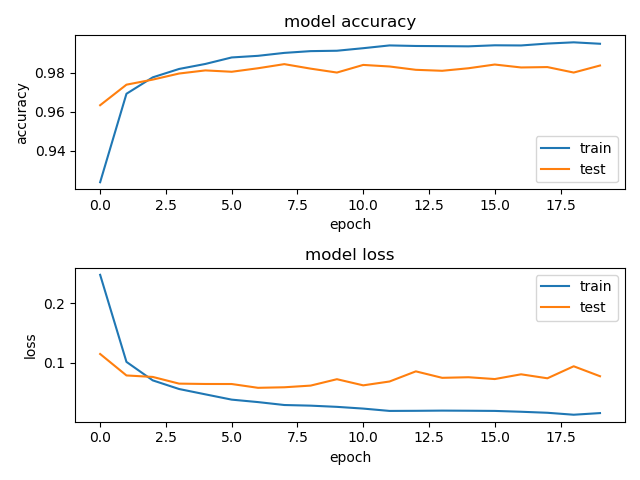

In [605]:


# plotting the metrics
fig = plt.figure()
plt.subplot(2,1,1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')

plt.subplot(2,1,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')

plt.tight_layout()

In [607]:
import os

In [614]:
model_path

'/results/keras_mnist.h5'

In [616]:
model.save?

In [617]:
# saving the model
#os.mkdir("results")
save_dir = "results/"
model_name = 'keras_mnist.h5'
model_path = os.path.join(save_dir, model_name)
model.save(model_path)
print('Saved trained model at %s ' % model_path)

Saved trained model at results/keras_mnist.h5 


In [621]:
from keras.models import load_model

In [ ]:
model.fit(x_train, y_train,
          batch_size=128, epochs=20,
          verbose=2,
          validation_data=(x_test,  y_test))


9836  classified correctly
164  classified incorrectly


<IPython.core.display.Javascript object>


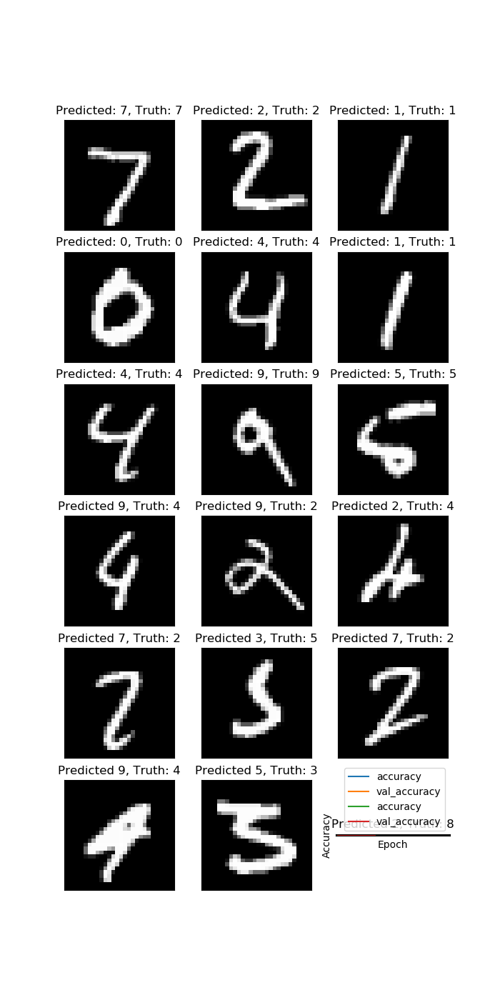

In [625]:
# load the model and create predictions on the test set
mnist_model = load_model(model_path)
predicted_classes = mnist_model.predict_classes(x_test)

# see which we predicted correctly and which not
correct_indices = np.nonzero(predicted_classes == y_test)[0]
incorrect_indices = np.nonzero(predicted_classes != y_test)[0]
print()
print(len(correct_indices)," classified correctly")
print(len(incorrect_indices)," classified incorrectly")

# adapt figure size to accomodate 18 subplots
plt.rcParams['figure.figsize'] = (7,14)

figure_evaluation = plt.figure()

# plot 9 correct predictions
for i, correct in enumerate(correct_indices[:9]):
    plt.subplot(6,3,i+1)
    plt.imshow(x_test[correct].reshape(28,28), cmap='gray', interpolation='none')
    plt.title(
      "Predicted: {}, Truth: {}".format(predicted_classes[correct],
                                        y_test[correct]))
    plt.xticks([])
    plt.yticks([])

# plot 9 incorrect predictions
for i, incorrect in enumerate(incorrect_indices[:9]):
    plt.subplot(6,3,i+10)
    plt.imshow(x_test[incorrect].reshape(28,28), cmap='gray', interpolation='none')
    plt.title(
      "Predicted {}, Truth: {}".format(predicted_classes[incorrect], 
                                       y_test[incorrect]))
    plt.xticks([])
    plt.yticks([])

#figure_evaluation

## Clasificacion Basica: Predecir una imagen de moda



https://colab.research.google.com/github/tensorflow/docs-l10n/blob/master/site/es/tutorials/keras/classification.ipynb#scrollTo=R32zteKHCaXT

## Convolutional Neural Network (CNN)

In [630]:

from tensorflow.keras import datasets, layers, models

Download and prepare the CIFAR10 dataset

The CIFAR10 dataset contains 60,000 color images in 10 classes, with 6,000 images in each class. The dataset is divided into 50,000 training images and 10,000 testing images. The classes are mutually exclusive and there is no overlap between them.

https://www.tensorflow.org/tutorials/images/cnn

https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/images/cnn.ipynb

In [631]:
(train_images, train_labels), (test_images, test_labels) = datasets.cifar10.load_data()

# Normalize pixel values to be between 0 and 1
train_images, test_images = train_images / 255.0, test_images / 255.0

170500096/170498071 [==============================] - 8s 0us/step


In [635]:
train_images.shape

(50000, 32, 32, 3)

<IPython.core.display.Javascript object>


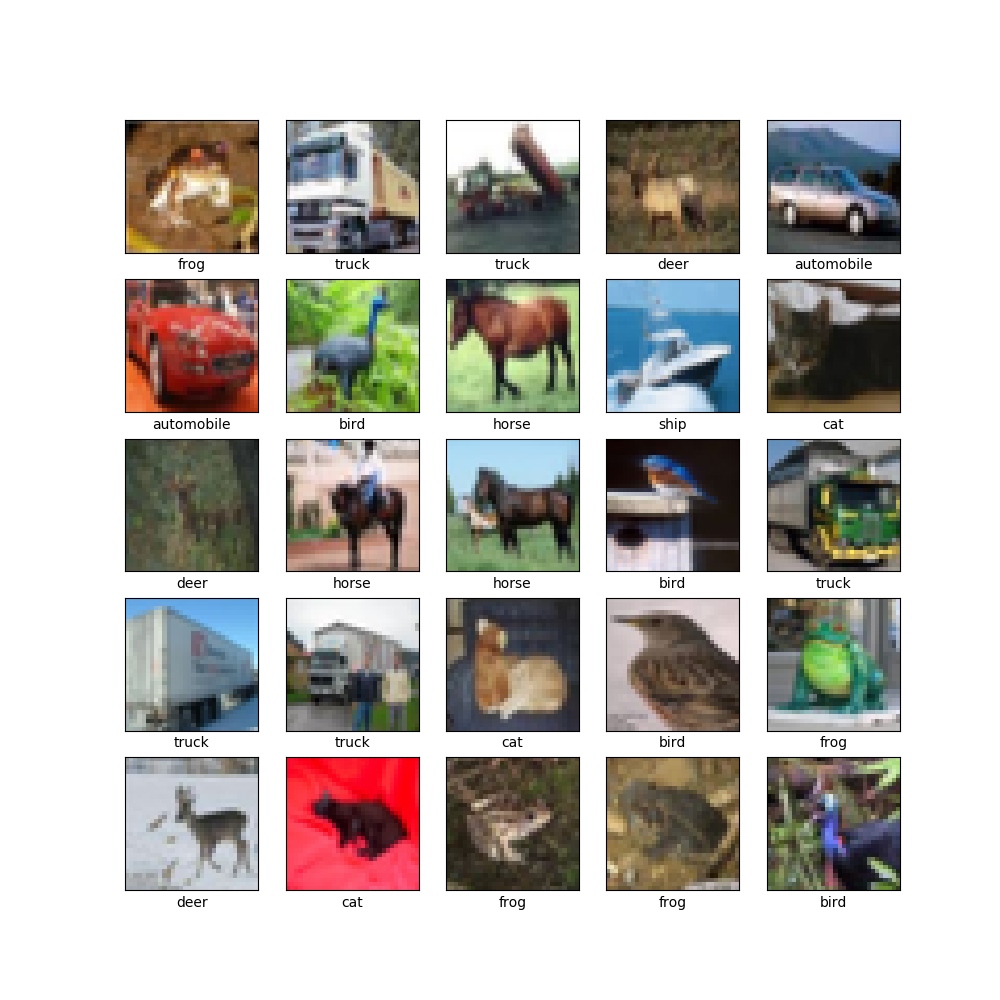

In [632]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    # The CIFAR labels happen to be arrays, 
    # which is why you need the extra index
    plt.xlabel(class_names[train_labels[i][0]])
plt.show()

Create the convolutional base

As input, a CNN takes tensors of shape (image_height, image_width, color_channels), ignoring the batch size. 

If you are new to these dimensions, color_channels refers to (R,G,B). 

In this example, you will configure our CNN to process inputs of shape (32, 32, 3), which is the format of CIFAR images. You can do this by passing the argument input_shape to our first layer.

In [649]:

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3) )) #,padding="same"))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10))


In [650]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 4, 4, 64)          36928     
_________________________________________________________________
flatten_5 (Flatten)          (None, 1024)              0         
_________________________________________________________________
dense_10 (Dense)             (None, 64)               

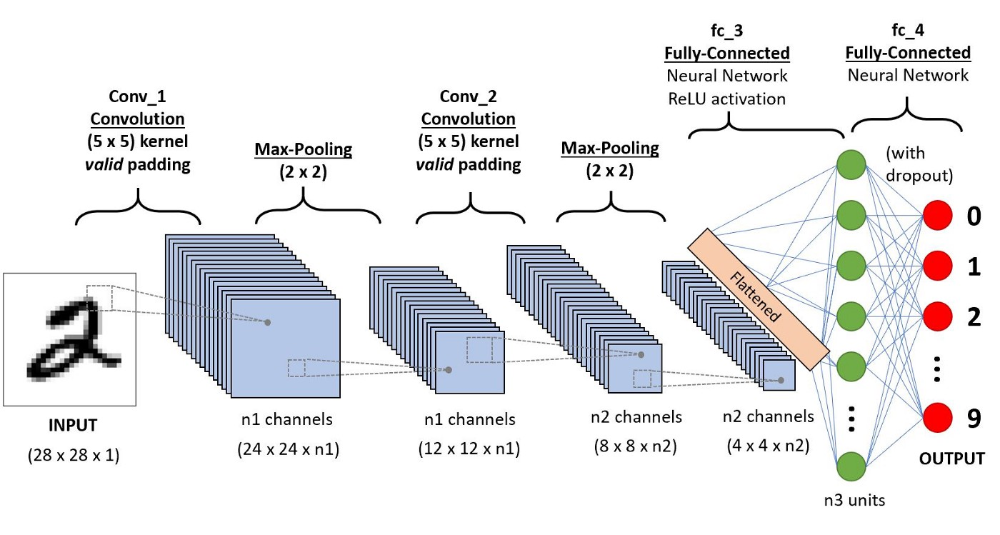

Convolution 
![SegmentLocal](keras_conv2d_padding.gif "segment")

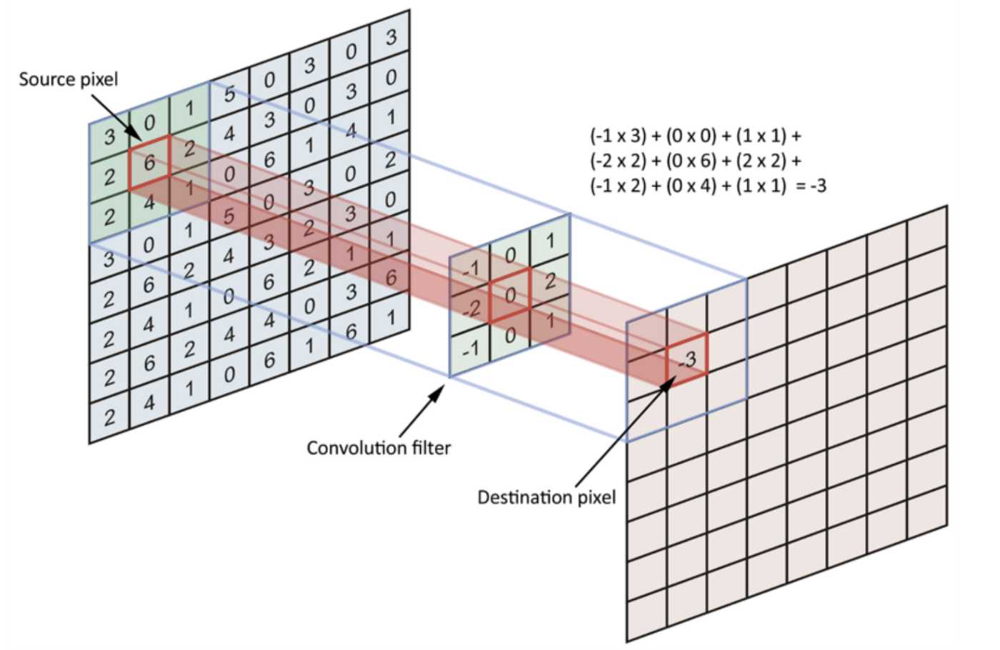

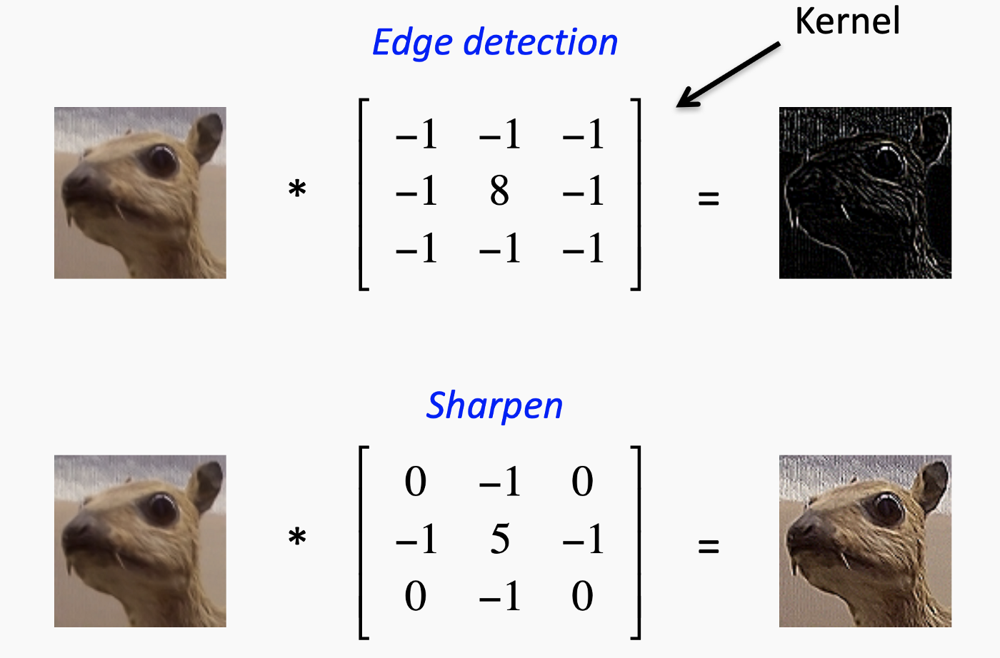

Padding
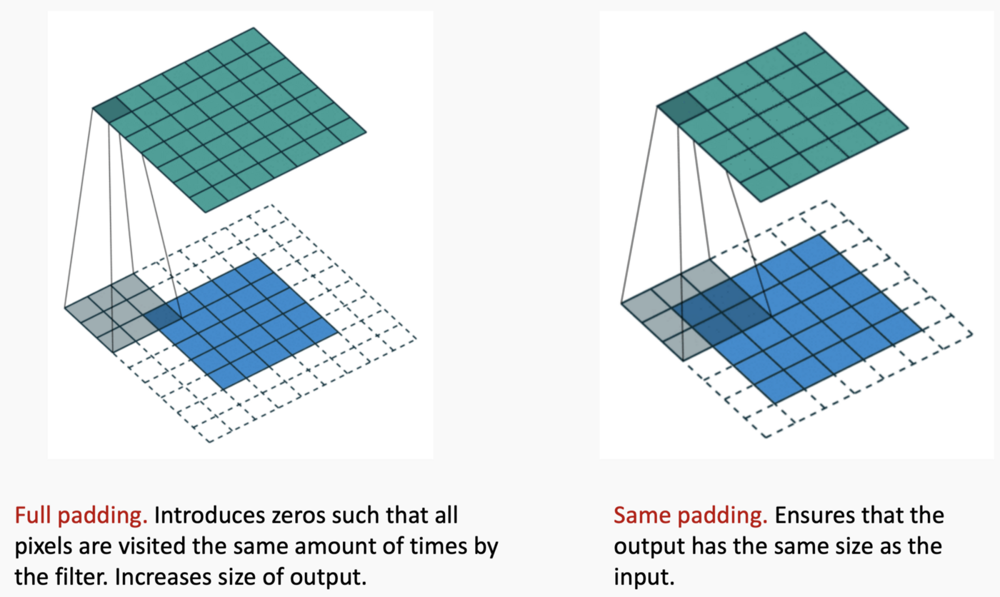


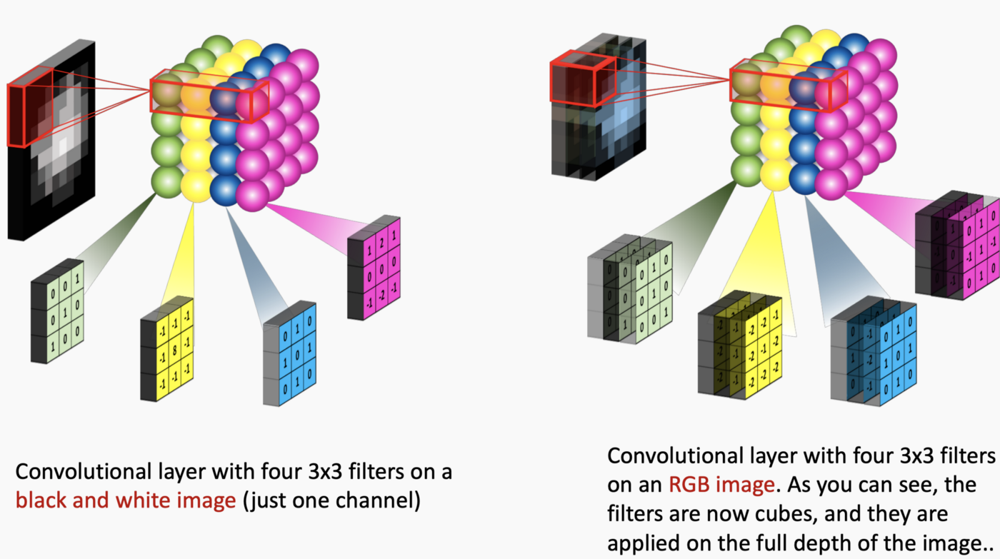

https://towardsdatascience.com/simple-introduction-to-convolutional-neural-networks-cdf8d3077bac

The role of the ConvNet is to reduce the images into a form which is easier to process, without losing features which are critical for getting a good prediction. 

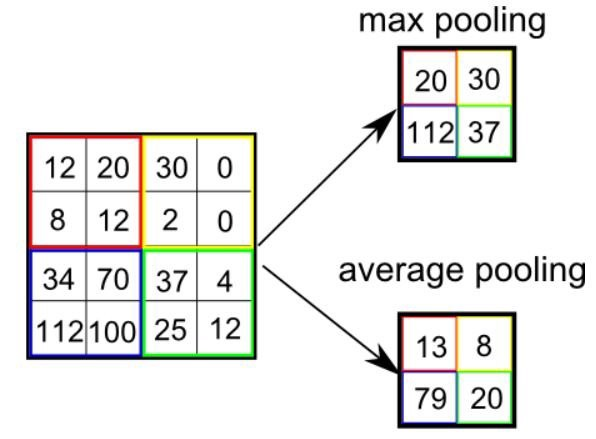

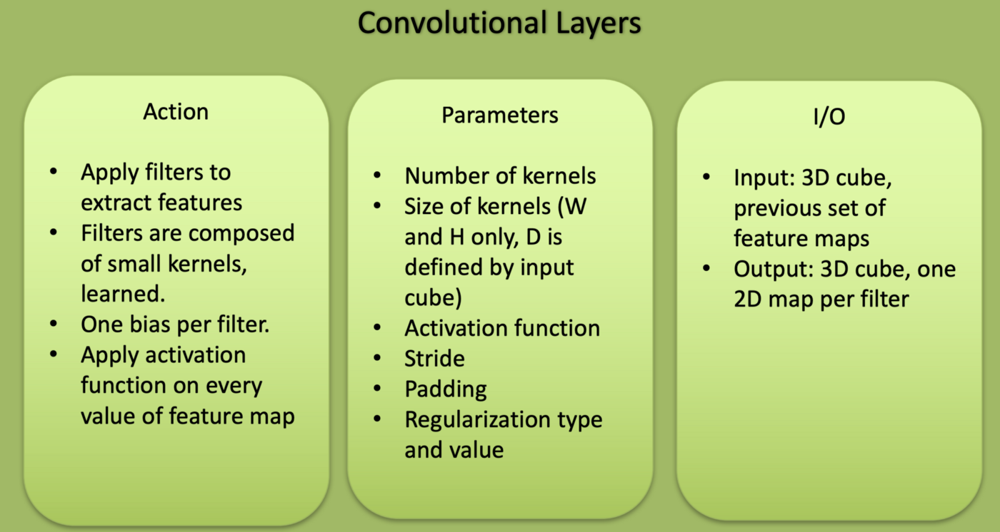

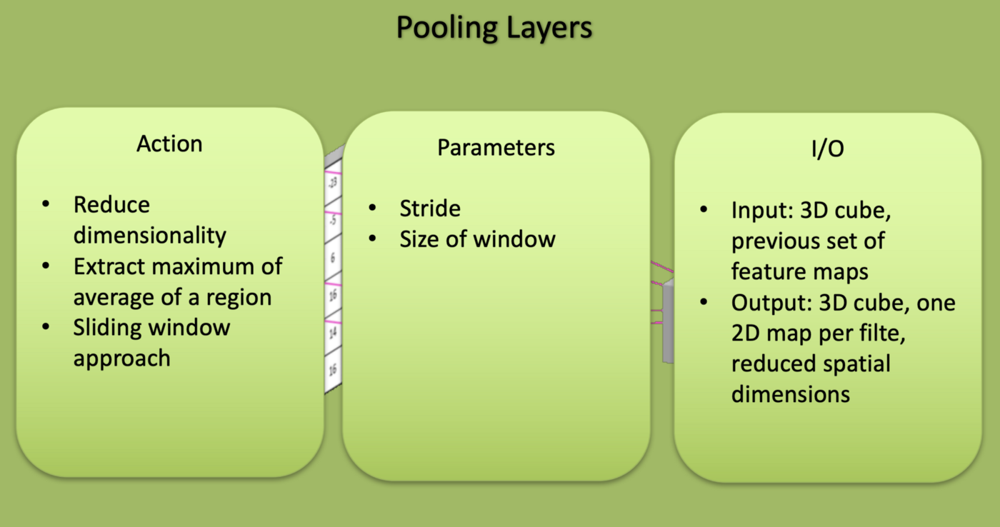

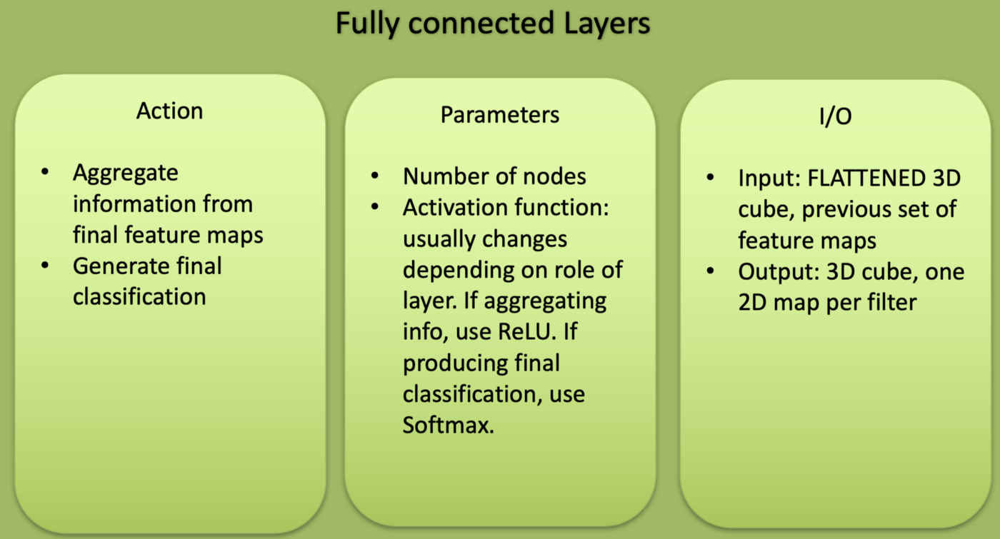

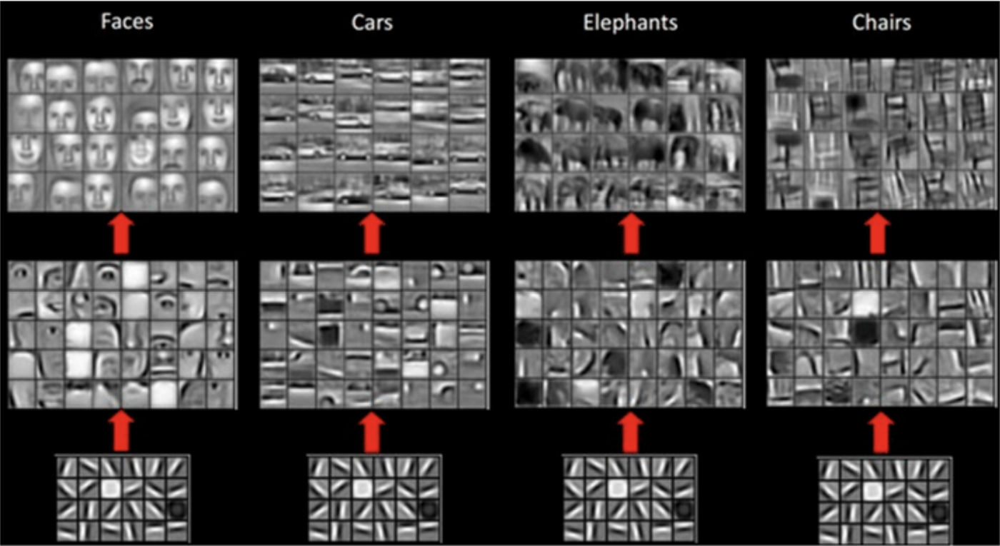

What do CNN layers learn?

- Each CNN layer learns filters of increasing complexity.

- The first layers learn basic feature detection filters: edges, corners, etc

- The middle layers learn filters that detect parts of objects. For faces, they might learn to respond to eyes, noses, etc

- The last layers have higher representations: they learn to recognize full objects, in different shapes and positions.

# 3D Example

https://www.cs.ryerson.ca/~aharley/vis/conv/

In [651]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(train_images, train_labels, epochs=10, 
                    validation_data=(test_images, test_labels))

Train on 50000 samples, validate on 10000 samples
Epoch 1/10
50000/50000 [==============================] - 23s 466us/sample - loss: 1.5425 - accuracy: 0.4361 - val_loss: 1.2919 - val_accuracy: 0.5326
Epoch 2/10
50000/50000 [==============================] - 34s 681us/sample - loss: 1.1846 - accuracy: 0.5800 - val_loss: 1.1063 - val_accuracy: 0.6045
Epoch 3/10
50000/50000 [==============================] - 27s 539us/sample - loss: 1.0448 - accuracy: 0.6339 - val_loss: 1.0606 - val_accuracy: 0.6260
Epoch 4/10
50000/50000 [==============================] - 30s 595us/sample - loss: 0.9516 - accuracy: 0.6655 - val_loss: 0.9831 - val_accuracy: 0.6561
Epoch 5/10
50000/50000 [==============================] - 28s 563us/sample - loss: 0.8715 - accuracy: 0.6973 - val_loss: 0.9252 - val_accuracy: 0.6760
Epoch 6/10
50000/50000 [==============================] - 27s 549us/sample - loss: 0.8128 - accuracy: 0.7158 - val_loss: 0.9156 - val_accuracy: 0.6818
Epoch 7/10
50000/50000 [====================

In [652]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)

10000/10000 - 1s - loss: 0.9231 - accuracy: 0.6943


In [ ]:
print(test_acc)

## tutorial uses a filtered version of Dogs vs Cats dataset from Kaggle.
https://www.tensorflow.org/tutorials/images/classification

https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53

https://www.pyimagesearch.com/2018/12/31/keras-conv2d-and-convolutional-layers/

1º Super Fluidez - Modelo DAIN y App:
https://github.com/baowenbo/DAIN

https://grisk.itch.io/dain-app

2º Super Resolución - TecoGAN y Notebook:
https://github.com/thunil/TecoGAN

https://colab.research.google.com/git...

3º Colorización - DeOldify:
https://github.com/jantic/DeOldify


4 Tensorflow Object Detection API
https://github.com/tensorflow/models/tree/master/research/object_detection

5 Awesome-lane-detection

https://github.com/amusi/awesome-lane-detection#2020




In [ ]:
https://s3-us-west-2.amazonaws.com/static.pyimagesearch.com/keras-conv2d/keras_conv2d_padding.gif

In [626]:
import urllib.request

In [627]:
url = "https://s3-us-west-2.amazonaws.com/static.pyimagesearch.com/keras-conv2d/keras_conv2d_padding.gif"

urllib.request.urlretrieve(url, 'keras_conv2d_padding.gif')

('keras_conv2d_padding.gif', <http.client.HTTPMessage at 0x1de61899288>)

In [653]:
!start .

https://www.youtube.com/watch?v=tIeHLnjs5U8

https://www.youtube.com/watch?v=d14TUNcbn1k

https://www.youtube.com/watch?v=aircAruvnKk

https://www.coursera.org/learn/machine-learning/resources/QQx8l

https://explained.ai/matrix-calculus/

http://www.cs.us.es/~fsancho/?e=165

https://peterroelants.github.io/posts/neural-network-implementation-part04/

https://www.youtube.com/watch?v=kft1AJ9WVDk

https://www.youtube.com/watch?v=DGsk6wJiYP0

https://www.tensorflow.org/datasets/performances#auto-caching

https://en.wikipedia.org/wiki/Accuracy_and_precision

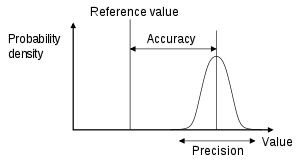

Accuracy is the proximity of measurement results to the true value; precision is the degree to which repeated (or reproducible) measurements under unchanged conditions show the same results.